# CarND-Advanced-Lane-Lines

## Project Steps:

1. Camera calibration
2. Distortion correction
3. Color/gradient threshold
4. Perspective transform
5. Detect lane lines
6. Determine the lane curvature

## 1. Camera calibration


In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import toolbox
%matplotlib inline

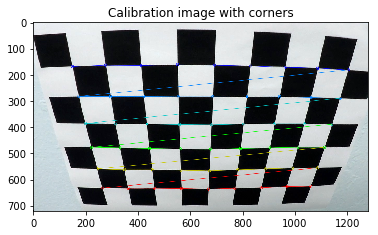

In [2]:
#Finding Corners in a calibration image
fname = './camera_cal/calibration2.jpg'
img = cv2.imread(fname)

# prepare object points
nx = 9#TODO: enter the number of inside corners in x
ny = 6#TODO: enter the number of inside corners in y

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)
    plt.title("Calibration image with corners")


In [3]:
#prepare object points
nx = 9#TODO: enter the number of inside corners in x
ny = 6#TODO: enter the number of inside corners in y

#read all images in folder
images = glob.glob('./camera_cal/calibration*.jpg')

objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

objp = np.zeros([ny*nx,3], np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # x, y coordinates

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# If cornes are found, add object points, add image points and draw corners
for name in images:
    img = cv2.imread(name)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

In [4]:
#Undistorting a test image:
fname = './camera_cal/calibration1.jpg'
img = cv2.imread(fname)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

#plt.imshow(img)

#Camera calibration, given object points, image points, and the shape of the grayscale image:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
#ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)
undistorted = cv2.undistort(img, mtx, dist, None, mtx)

## 2. Distortion correction


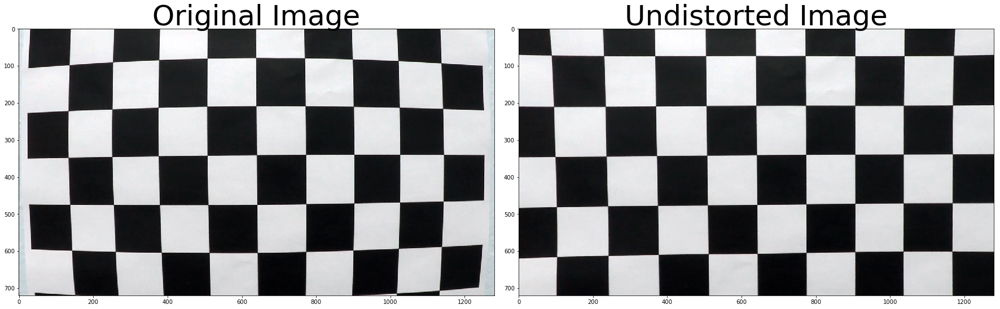

In [5]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### An example of a distortion-corrected image.

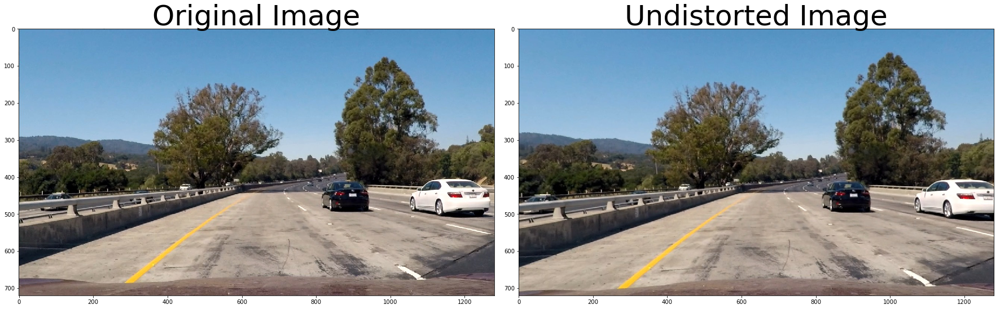

In [6]:
fname = './test_images/test1.jpg'
img = mpimg.imread(fname)

##Note: If you are reading in an image using mpimg.imread() 
##this will read in an RGB image and you should convert to grayscale using cv2.COLOR_RGB2GRAY
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

##Another way to retrieve the image shape, is to get them directly 
##from the color image by retrieving the first two values in the color image shape array using img.shape[0:2].
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
undistorted = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 3. Color & Gradient Threshold

In [193]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x',sobel_kernel=3, thresh=(30, 100)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if(orient == 'x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    sobelbinary = np.zeros_like(scaled_sobel)
    sobelbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    #plt.imshow(sxbinary, cmap='gray')
    # 6) Return this mask as your binary_output image
    return sobelbinary
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold

def mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    # 3) Calculate the magnitude
    sobelx2 = np.square(sobelx)
    sobely2 = np.square(sobely)
    abs_sobel = np.sqrt(sobelx2 + sobely2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a binary mask where mag thresholds are met
    thresh_min = mag_thresh[0]
    thresh_max = mag_thresh[1]
    sobelbinary = np.zeros_like(scaled_sobel)
    sobelbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return sobelbinary
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.

def dir_threshold(img, sobel_kernel=15, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    sobelbinary = np.zeros_like(grad_dir)
    sobelbinary[(grad_dir >= thresh_min) & (grad_dir <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return sobelbinary

def combine_grad(image):
    # Choose a Sobel kernel size
    ksize = 9 # Choose a larger odd number to smooth gradient measurements

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [295]:
# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    
    img = np.copy(img)
    
    
    ##STEP 1: Distorsion Correction
    img = cv2.undistort(img, mtx, dist, None, mtx)

    ##STEP 2: warper image image
    
    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    #gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Gaussian Blur
    #kernel_size = 5
    #img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    h_channel = hsv[:,:,0]
    s_channel = hsv[:,:,2]
    
    ######################
    # Sobel x
    sobelx = cv2.Sobel(s_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    ######################
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    
    #####################################
    R = img[:, :, 0]
    R  = np.dstack(( R, np.zeros_like(R), np.zeros_like(R)))
    R_grad_binary = combine_grad(img)

    ##Results:
    ##Stack filters
    color_binary = np.dstack(( R_grad_binary, sxbinary, s_binary))
    ##Combined filters
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(R_grad_binary==1) | (s_binary == 1) | (sxbinary == 1)] = 1

    
    '''
    # Defining vertices for marked area
    imshape = img.shape
    left_bottom = (100, imshape[0])
    right_bottom = (imshape[1]-20, imshape[0])
    apex1 = (610, 410)
    apex2 = (680, 410)
    inner_left_bottom = (310, imshape[0])
    inner_right_bottom = (1150, imshape[0])
    inner_apex1 = (700,480)
    inner_apex2 = (650,480)
    vertices = np.array([[left_bottom, apex1, apex2,
                          right_bottom, inner_right_bottom,
                          inner_apex1, inner_apex2, inner_left_bottom]], dtype=np.int32)
    # Masked area
    color_binary = region_of_interest(color_binary, vertices)
    '''
    #toolbox.plot3img(s_binary,sxbinary,color_binary)
    return combined_binary, color_binary, sxbinary, s_binary
    


## 3.1 Color Thresholds: 
### Testing Color Thresholds in RGB Space

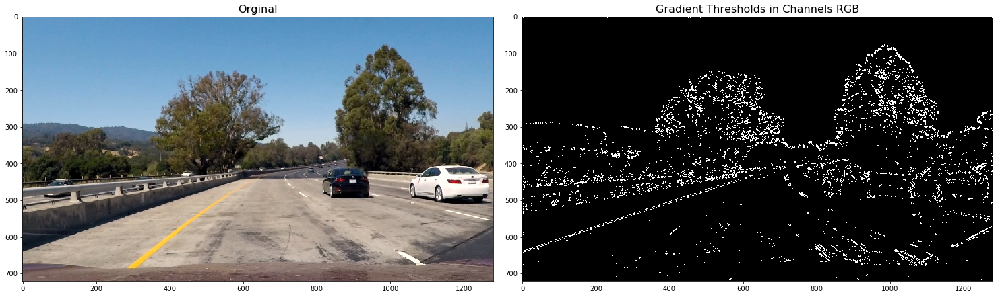

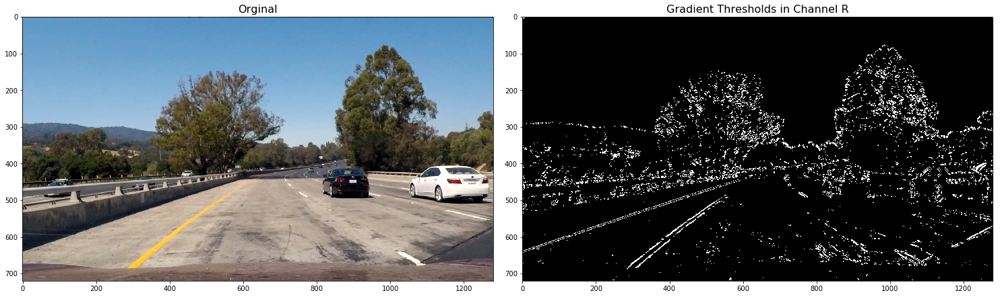

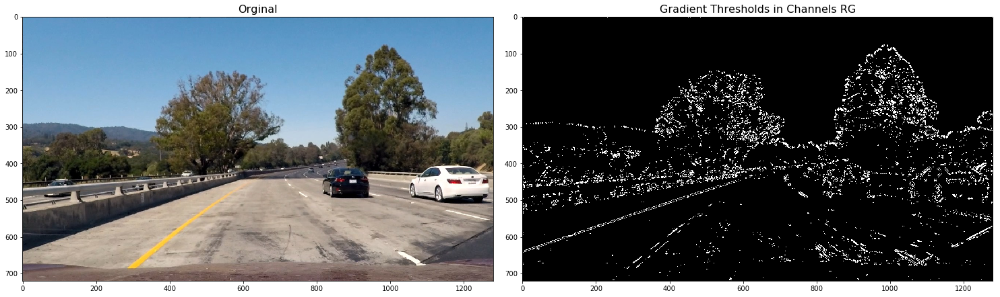

In [178]:
fname = './test_images/test1.jpg'

##Note: If you read in an image using matplotlib.image.imread() you will get an RGB image, 
##but if you read it in using OpenCV cv2.imread() this will give you a BGR image.

#Read BGR image
#img = cv2.imread(fname)

#Read RGB image
img = mpimg.imread(fname)
img = np.copy(img)

R = img[:, :, 0]
G = img[:, :, 1]

RG = np.dstack(( R, G, np.zeros_like(R)))

R  = np.dstack(( R, np.zeros_like(R), np.zeros_like(R)))

combined_img = combine_grad(img)
toolbox.plot2img(img, combined_img,['Orginal', 'Gradient Thresholds in Channels RGB'])

combined_img = combine_grad(R)
toolbox.plot2img(img, combined_img, ['Orginal', 'Gradient Thresholds in Channel R'])

combined_img = combine_grad(RG)
toolbox.plot2img(img, combined_img, ['Orginal', 'Gradient Thresholds in Channels RG'])


## 3.2  Testing Combined Thresholds
+ Gradient thresholds using RGB Space
+ Color thresholds using HLS Space

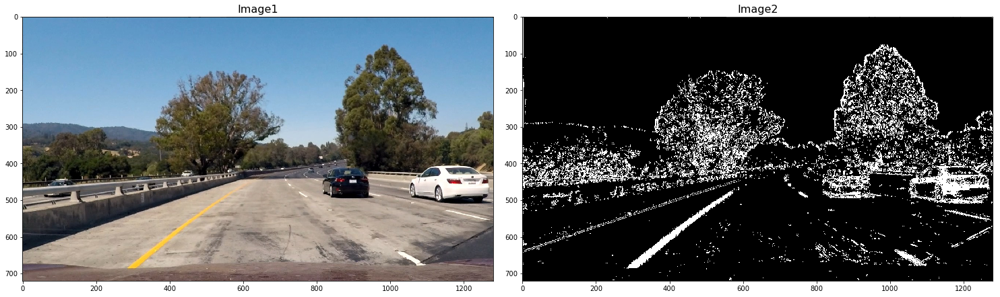

In [172]:
fname = './test_images/test1.jpg'
#Read RGB image
img = mpimg.imread(fname)
combined_binary, color_binary, sxbinary, s_binary = pipeline(img)

img = mpimg.imread(fname)
toolbox.plot2img(img, combined_binary)

# Plot the result

#### Now, I test combined thresholds over all images in test folder

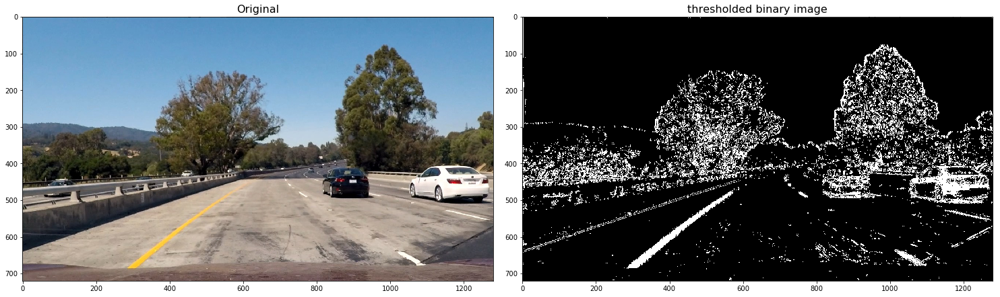

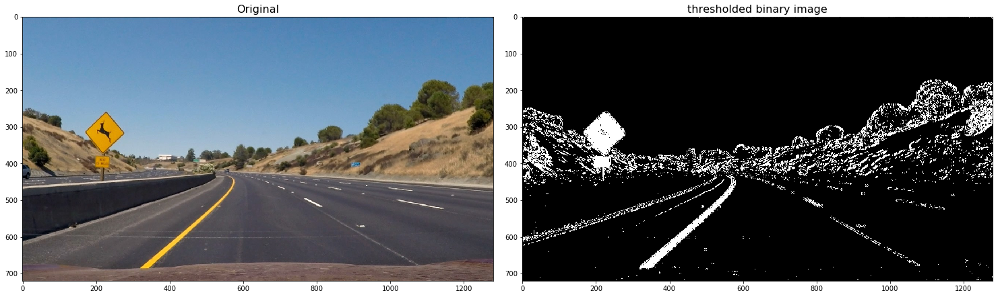

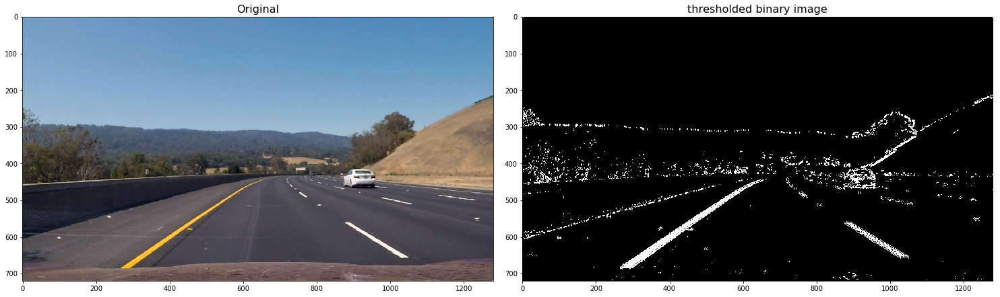

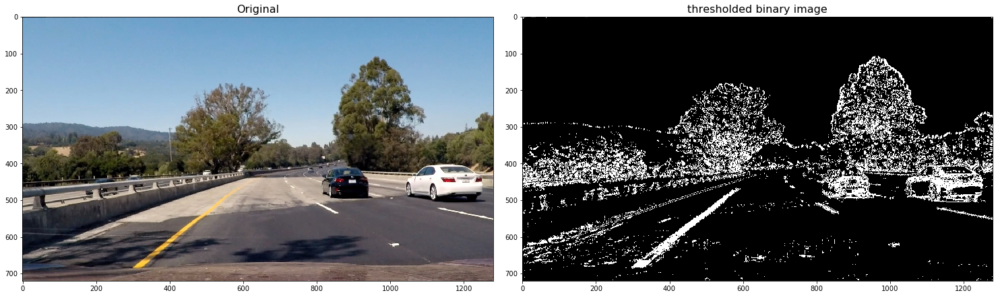

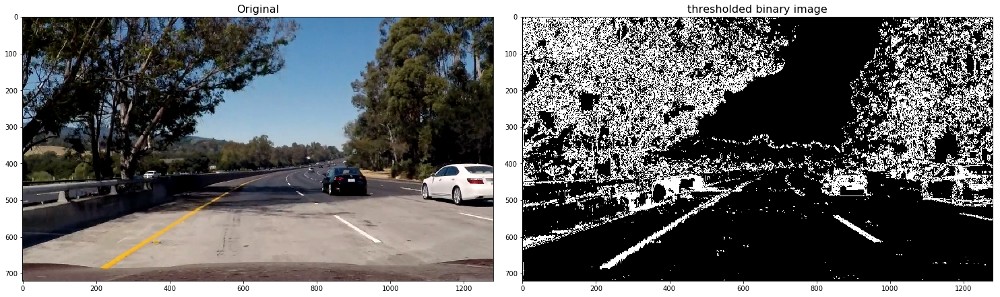

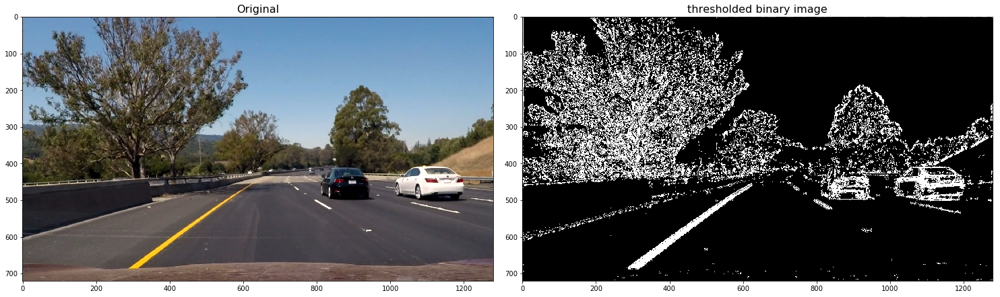

In [173]:
#read all images in folder
images = glob.glob('./test_images/test*.jpg')
for fname in images:
    #Read RGB image
    img = mpimg.imread(fname)
    combined_binary, color_binary, sxbinary, s_binary = pipeline(img)
    img = mpimg.imread(fname)
    toolbox.plot2img(img, combined_binary, ['Original', 'thresholded binary image'])

## 4. Perspective Transform

**Notes:**
Pick four points in a trapezoidal shape (similar to region masking) that would represent a rectangle when looking down on the road from above.

The easiest way to do this is to investigate an image where the lane lines are straight, and find four points lying along the lines that, after perspective transform, make the lines look straight and vertical from a bird's eye view perspective.

In [275]:
def warper(img, mtx, dist, draw_poly=False):
    '''
    img = img.copy()
    img_size = (img.shape[1], img.shape[0])
    
    # Vertices to perspective transform
    src = np.float32(
    [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
    [((img_size[0] / 6) - 10), img_size[1]],
    [(img_size[0] * 5 / 6) + 60, img_size[1]],
    [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    
    pts = np.array(src, np.int32)
    pts = pts.reshape((-1,1,2))
    copy = img.copy()
    poly = cv2.polylines(copy,[pts],True,(255,0,0), thickness=3)
    
    dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])

    print(src)
    print(dst)
    '''
    
    # Vertices
    bottom_left = [203,720]
    bottom_right = [1127, 720]
    top_left = [585, 460]
    top_right = [695, 460]
    source = np.float32([bottom_left,bottom_right,top_right,top_left])

    pts = np.array([bottom_left,bottom_right,top_right,top_left], np.int32)
    pts = pts.reshape((-1,1,2))
    
    copy = img.copy()
    poly = cv2.polylines(copy,[pts], True, (255,0,0), thickness=3)

    # Destination points
    bottom_left = [320,720]
    bottom_right = [920, 720]
    top_left = [320, 1]
    top_right = [920, 1]
    dst = np.float32([bottom_left,bottom_right,top_right,top_left])

    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(source, dst)
    # Warp the image using OpenCV warpPerspective() to warp your image to a top-down view
    img_size = (img.shape[1], img.shape[0])
    
    if (draw_poly == True):
        warped = cv2.warpPerspective(copy, M, img_size, flags=cv2.INTER_LINEAR)
    else:
        warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

        
    # Return the resulting image and matrix
    return warped, poly

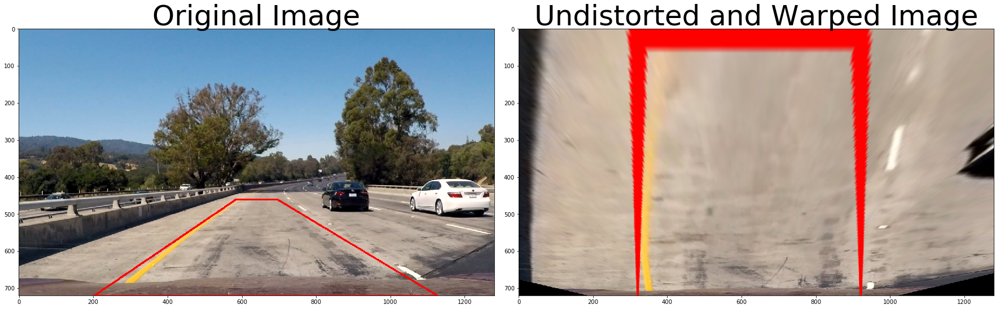

In [276]:
fname = './test_images/test1.jpg'
#Read RGB image
img = mpimg.imread(fname)
top_down, poly = warper(img, mtx, dist, draw_poly=True)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(poly)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 5. Detect lane lines

Locate the Lane Lines and Fit a Polynomial

Notes:
You now have a thresholded warped image and you're ready to map out the lane lines! There are many ways you could go about this, but here's one example of how you might do it:

Line Finding Method: Peaks in a Histogram

After applying calibration, thresholding, and a perspective transform to a road image, you should have a binary image where the lane lines stand out clearly. However, you still need to decide explicitly which pixels are part of the lines and which belong to the left line and which belong to the right line.

I first take a histogram along all the columns in the lower half of the image like this:

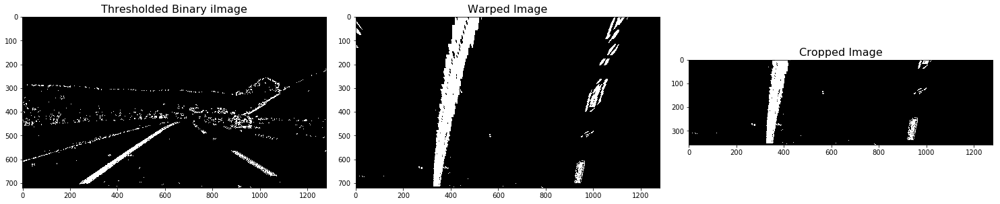

In [296]:
fname = './test_images/test3.jpg'
#Read RGB image
img = mpimg.imread(fname)

combined_binary, _, _, _ = pipeline(img)
warped, poly = warper(combined_binary, mtx, dist, draw_poly=False)
binary_warped = warped[warped.shape[0]//2:,:]

toolbox.plot3img(combined_binary, warped, binary_warped, ['Undistorted & Thresholded Binary Image','Warped Image','Cropped Image'])



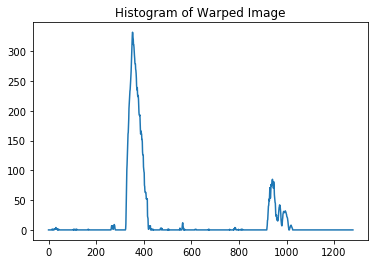

In [298]:
histogram = np.sum(binary_warped, axis=0)
plt.plot(histogram)
plt.title('Histogram of Warped Image')
plt.show()

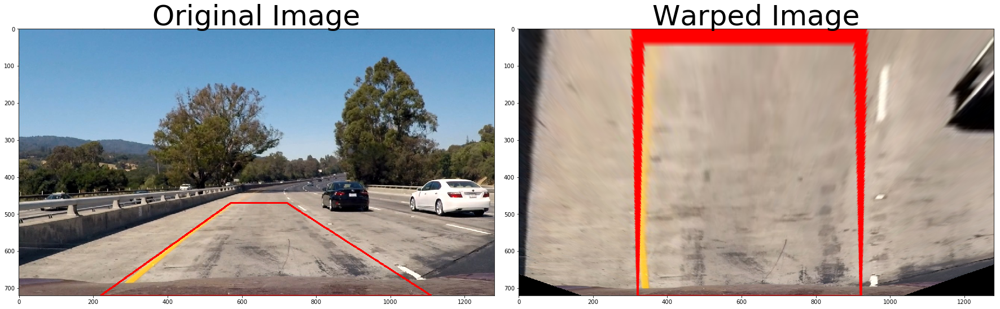

In [254]:
# Vertices extracted manually for performing a perspective transform
bottom_left = [220,720]
bottom_right = [1110, 720]
top_left = [570, 470]
top_right = [722, 470]

source = np.float32([bottom_left,bottom_right,top_right,top_left])

pts = np.array([bottom_left,bottom_right,top_right,top_left], np.int32)
pts = pts.reshape((-1,1,2))
copy = img.copy()
cv2.polylines(copy,[pts],True,(255,0,0), thickness=3)

# Destination points are chosen such that straight lanes appear more or less parallel in the transformed image.
bottom_left = [320,720]
bottom_right = [920, 720]
top_left = [320, 1]
top_right = [920, 1]

dst = np.float32([bottom_left,bottom_right,top_right,top_left])
M = cv2.getPerspectiveTransform(source, dst)
M_inv = cv2.getPerspectiveTransform(dst, source)
img_size = (img.shape[1], img.shape[0])

warped = cv2.warpPerspective(copy, M, img_size , flags=cv2.INTER_LINEAR)
    
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(copy)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped, cmap='gray')
ax2.set_title('Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [144]:
def pipeline2(img):
    
    #img = cv2.undistort(img, cameraMatrix, distortionCoeffs, None, cameraMatrix)
    
    # convert to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    height, width = gray.shape
    
    # apply gradient threshold on the horizontal gradient
    sx_binary = abs_sobel_thresh(gray, 'x', 10, 200)
    
    # apply gradient direction threshold so that only edges closer to vertical are detected.
    dir_binary = dir_threshold(gray, thresh=(np.pi/6, np.pi/2))
    
    # combine the gradient and direction thresholds.
    combined_condition = ((sx_binary == 1) & (dir_binary == 1))
    
    # R & G thresholds so that yellow lanes are detected well.
    color_threshold = 150
    R = img[:,:,0]
    G = img[:,:,1]
    color_combined = np.zeros_like(R)
    r_g_condition = (R > color_threshold) & (G > color_threshold)
    
    
    # color channel thresholds
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    L = hls[:,:,1]
    
    # S channel performs well for detecting bright yellow and white lanes
    s_thresh = (100, 255)
    s_condition = (S > s_thresh[0]) & (S <= s_thresh[1])
    
    # We put a threshold on the L channel to avoid pixels which have shadows and as a result darker.
    l_thresh = (120, 255)
    l_condition = (L > l_thresh[0]) & (L <= l_thresh[1])

    # combine all the thresholds
    # A pixel should either be a yellowish or whiteish
    # And it should also have a gradient, as per our thresholds
    color_combined[(r_g_condition & l_condition) & (s_condition | combined_condition)] = 1
    
    # apply the region of interest mask
    mask = np.zeros_like(color_combined)
    region_of_interest_vertices = np.array([[0,height-1], [width/2, int(0.5*height)], [width-1, height-1]], dtype=np.int32)
    cv2.fillPoly(mask, [region_of_interest_vertices], 1)
    thresholded = cv2.bitwise_and(color_combined, mask)
    
    return thresholded
def abs_sobel_thresh(gray, orient='x', thresh_min=0, thresh_max=255):
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    max_value = np.max(abs_sobel)
    binary_output = np.uint8(255*abs_sobel/max_value)
    threshold_mask = np.zeros_like(binary_output)
    threshold_mask[(binary_output >= thresh_min) & (binary_output <= thresh_max)] = 1
    return threshold_mask

def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    direction = np.arctan2(abs_sobel_y,abs_sobel_x)
    direction = np.absolute(direction)
    # 5) Create a binary mask where direction thresholds are met
    mask = np.zeros_like(direction)
    mask[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return mask

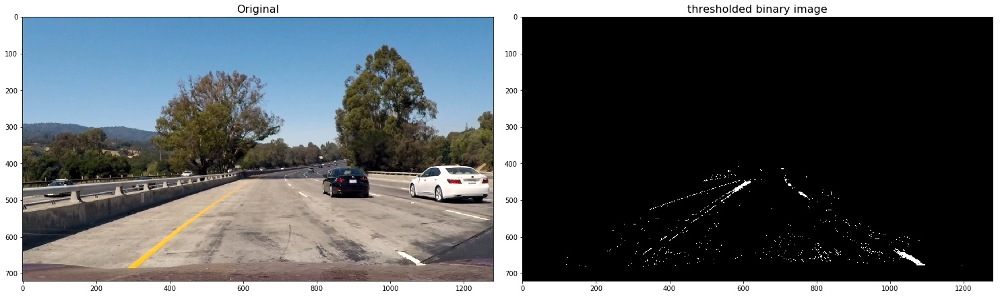

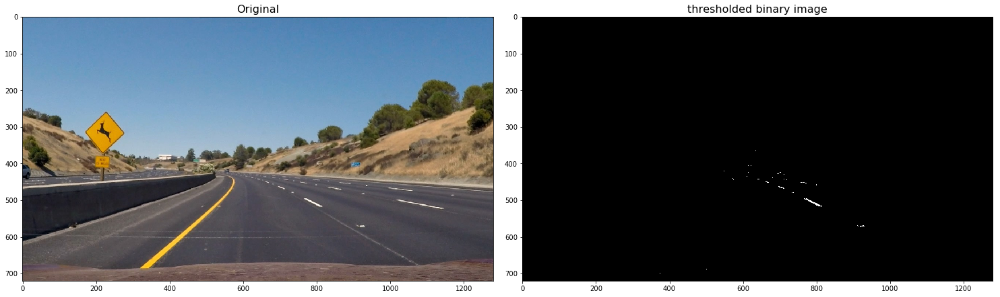

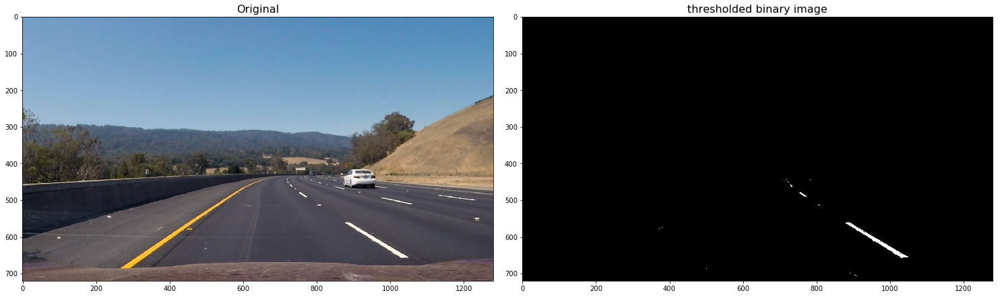

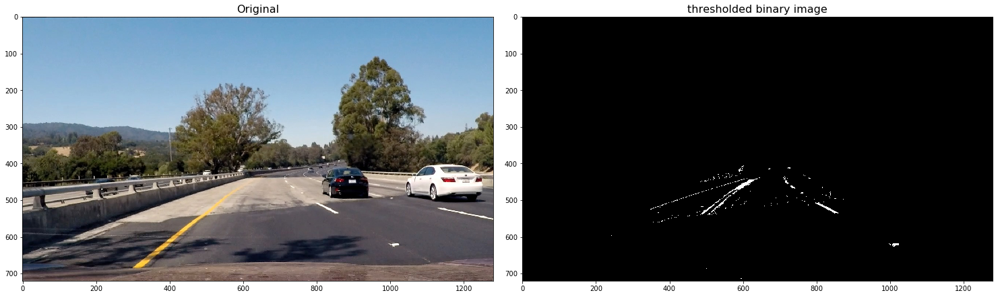

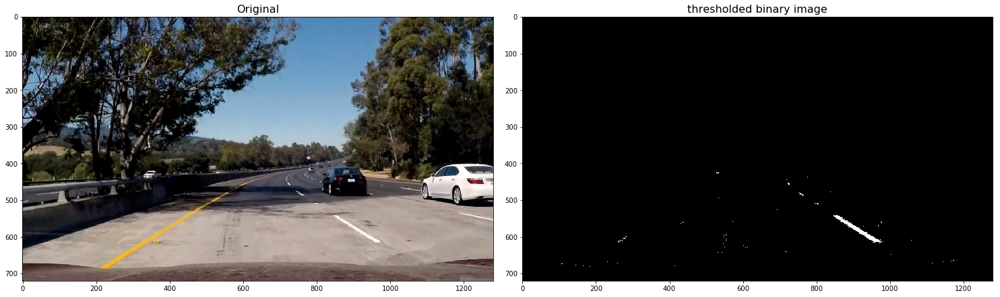

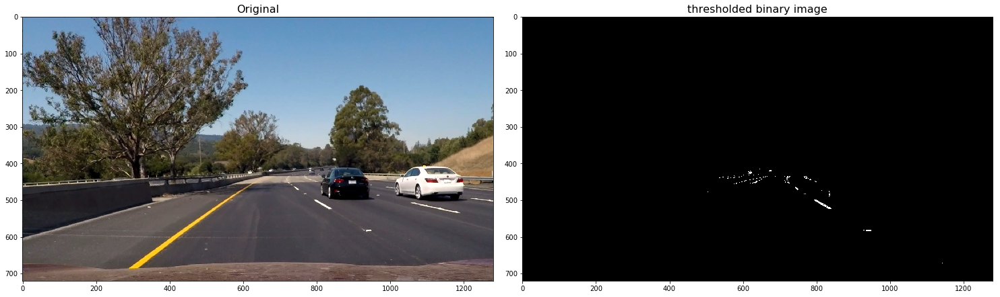

In [145]:
#read all images in folder
images = glob.glob('./test_images/test*.jpg')
for fname in images:
    img = cv2.imread(fname)
    combined_binary = pipeline2(img)
    img = mpimg.imread(fname)
    toolbox.plot2img(img, combined_binary, ['Original', 'thresholded binary image'])

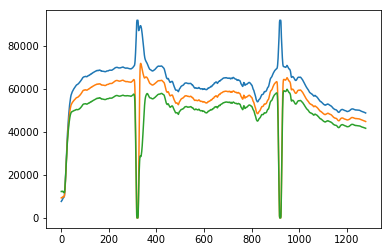

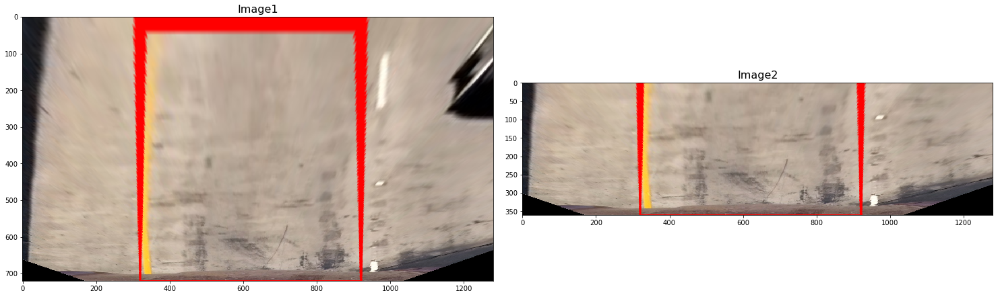

In [246]:
binary_warped = warped[warped.shape[0]//2:,:]
histogram = np.sum(binary_warped, axis=0)
plt.plot(histogram)
toolbox.plot2img(warped, binary_warped)

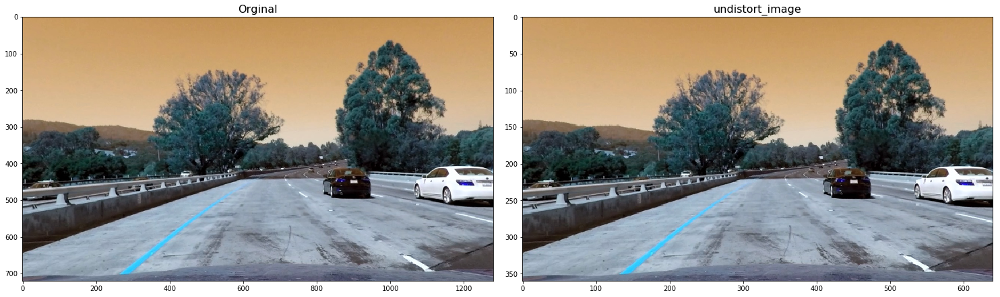

In [192]:
#Undistort image and crop image test 
fname = './test_images/test1.jpg'
img = cv2.imread(fname)
undistort_image = cv2.undistort(img, mtx, dist, None, mtx)
#toolbox.plot2img(img, undistort_image, ['Orginal', 'undistort_image'])
#dst = cv2.resize(undistort_image, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)
#toolbox.plot2img(img, dst, ['Orginal', 'undistort_image'])

height, width = undistort_image.shape[:2]
dst2 = cv2.resize(undistort_image, (640,360), interpolation = cv2.INTER_CUBIC)
toolbox.plot2img(undistort_image, dst2, ['Orginal', 'undistort_image'])
